# **커스텀 Stable Diffusion** 🎨
*`🧨diffusers` 사용하기!*

Stable Diffusion 은 text-to-image latent diffusion model 입니다.  [CompVis](https://github.com/CompVis), [Stability AI](https://stability.ai/), [LAION](https://laion.ai/) 이 다 같이 만들었습니다.  
[LAION-5B](https://laion.ai/blog/laion-5b/) 512x512 데이터 베이스로 학습이 되었습니다.
고정된 CLIP ViT-L/14 텍스트 인코더를 이용에서 텍스트 프롬프트를 사용합니다.  
860M UNet 과 123M 텍스트 인코더를 사용해서, 일반 사용자용 GPU 들에서 연산이 가능할 만큼 가볍습니다.  

참고 - [model card](https://huggingface.co/CompVis/stable-diffusion)

 Stable Diffusion을  🤗 Hugging Face [🧨 Diffusers library](https://github.com/huggingface/diffusers) 라이브러리로 사용해봅시다!


## 1. `StableDiffusionPipeline` 사용법

우선 Stable Diffusion 을 가볍게 사용해봅시다 🤗.

몇 줄의 코드만으로 한번 수행해 보겠습니다.

### Setup

빠른 연산을 위해 GPU 사용을 활성화 해 봅니다.  
아래 명령어들이 에러가 나면, colab 기준 오른쪽 위에 `Change runtime type`, `런타임 유형 변경` 으로 바꿔 봅시다.

In [1]:
!nvidia-smi

Wed May 29 04:19:26 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

 필요한 라이브러리를 설치하겠습니다.  
 diffusers, scipy, ftfy, transformers를 설치하겠습니다. accelerate를 사용하여 더 빠른 로딩을 달성할 수 있습니다. 설치를 시작하겠습니다.

In [2]:
!pip install diffusers
!pip install transformers scipy ftfy accelerate
!pip install -U peft

### Stable Diffusion Pipeline

`StableDiffusionPipeline` 가장 쉽게 사용할 수 있는 인터페이스 입니다. 코드 몇줄만 쓰면 바로 동작이 가능합니다.


pre-trained weights 를 로딩먼저 하겠습니다.  
Stable Diffusion version 1.4 ([CompVis/stable-diffusion-v1-4](https://huggingface.co/CompVis/stable-diffusion-v1-4)) 를 사용해보겠습니다. 다른 버전들도 많이 있으니 시도해 보셔도 좋습니다:
* [runwayml/stable-diffusion-v1-5](https://huggingface.co/runwayml/stable-diffusion-v1-5)
* [stabilityai/stable-diffusion-2-1-base](https://huggingface.co/stabilityai/stable-diffusion-2-1-base)
* [stabilityai/stable-diffusion-2-1](https://huggingface.co/stabilityai/stable-diffusion-2-1). 이 모델은 768x768 이미지를 지원합니다.

모든 Google Colab (무료 포함) 에서 Stable Diffusion 을 돌려볼 수 있게, half-precision branch [`fp16`](https://huggingface.co/CompVis/stable-diffusion-v1-4/tree/fp16) 를 불러 보겠습니다.  `diffusers` 라이브러리에게 다음과 같이 지정해주겠습니다. `torch_dtype=torch.float16`.

32bit 을 사용할 수도 있습니다. `torch_dtype=torch.float16` 를 지우면 되는데, 메모리는 더 먹습니다.


In [9]:
import torch
from diffusers import StableDiffusionPipeline

pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

GPU 를 셋팅해서 빠르게 수행할 수 있도록 하겠습니다.

In [3]:
pipe = pipe.to("cuda")

  0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


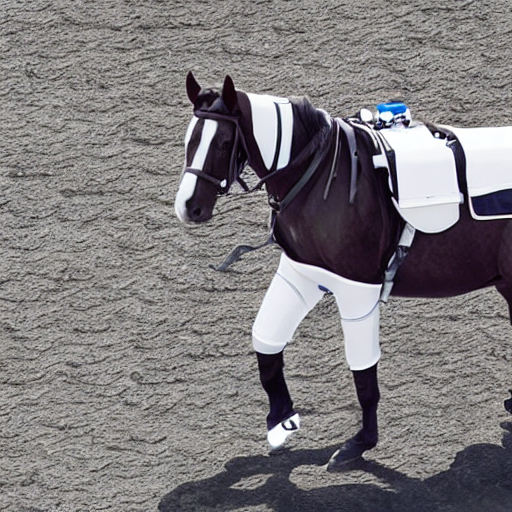

In [4]:
prompt = "a photograph of an astronaut (sponsored by samsung) riding a horse"
image = pipe(prompt).images[0]  # image here is in [PIL format](https://pillow.readthedocs.io/en/stable/)

# Now to display an image you can either save it such as:
image.save(f"astronaut_rides_horse.png")

# or if you're in a google colab you can directly display it with
image

Random seed 가 있기 때문에, 수행할때마다 다른 결과가 나옵니다.  
결과를 컨트롤 하고 싶으면 시드를 고정할 수도 있습니다.

  0%|          | 0/50 [00:00<?, ?it/s]

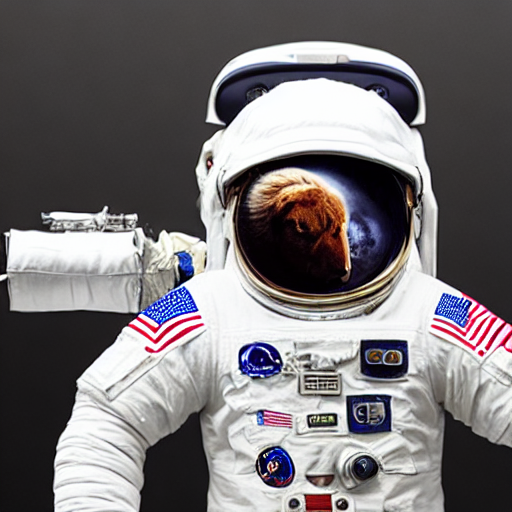

In [ ]:
import torch

generator = torch.Generator("cuda").manual_seed(2024)

image = pipe(prompt, generator=generator).images[0]

image

`num_inference_steps` 를 통해서 diffusion loop 횟수를 조절할 수 있습니다.
보통은 많이 하면 오래걸리고 품질이 좋아집니다.  
최신 모델은 적게해도 꽤 좋습니다. 50 정도를 추천합니다. (diffusers 만드신 분들의 추천입니다.)  
빠르게 하고 싶으시면, 줄여보세요.

같은 시드로 iteration 을 줄여서 한번 돌려보고, 비교해 봅시다.

  0%|          | 0/15 [00:00<?, ?it/s]

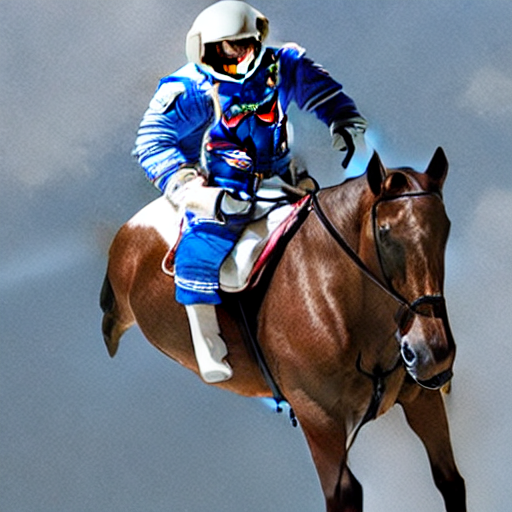

In [ ]:
import torch

generator = torch.Generator("cuda").manual_seed(1024)

image = pipe(prompt, num_inference_steps=15, generator=generator).images[0]

image



image_grid 함수를 만들어서 여러 이미지를 한번에 만들어 봅시다.

In [ ]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

같은 prompt 를 넣어서 동시에 여러개를 만들어 봅시다.

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

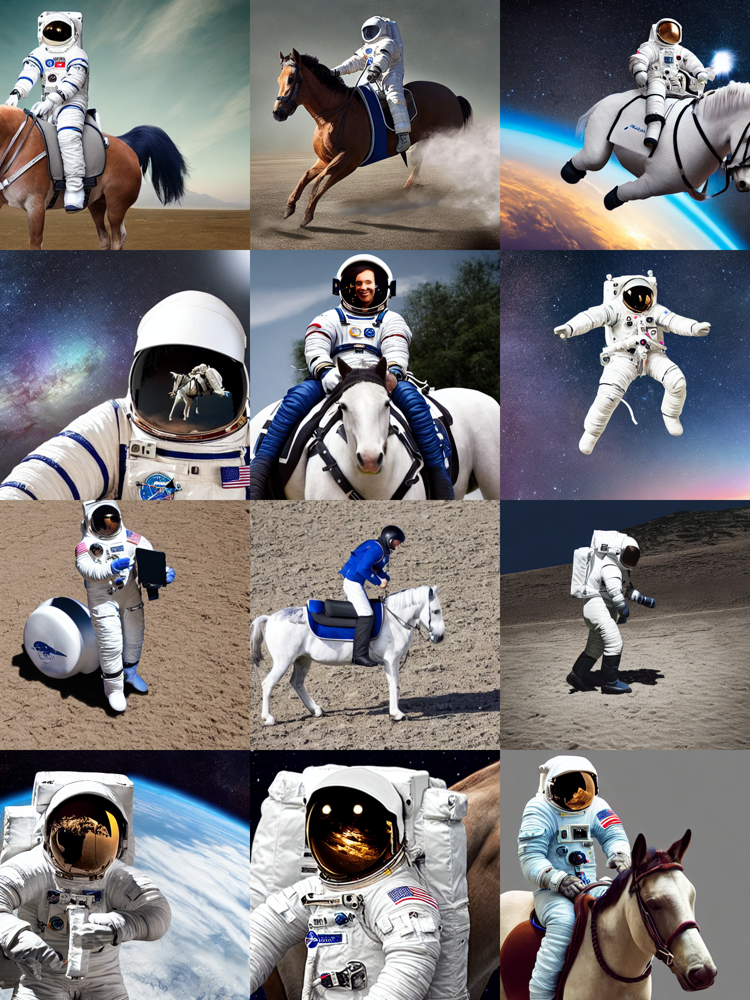

In [ ]:
num_cols = 3
num_rows = 4

prompt = ["a photograph of an astronaut (sponsored by samsung) riding a horse"] * num_cols

all_images = []
for i in range(num_rows):
  images = pipe(prompt).images
  all_images.extend(images)

grid = image_grid(all_images, rows=num_rows, cols=num_cols)
grid

### 정사각형 아닌 이미지 만들기

Stable Diffusion 은 `512 × 512`이미지를 기본으로 만듭니다.  `height`, `width` 그냥 넣어주면 됩니다.

추천 가이드입니다.:
- `height`, `width` 는 `8` 배수로 하시면 좋습니다.
-  512 아래로 내려가면 품질이 보통 떨어집니다.
- 양쪽으로 512 보다 키우면 영역이 반복이 되기 때문에 전체적인 일관성 (coherence) 가 떨어집니다.
- 가장 좋은 방법은 가로나 세로 하나를 512로 고정하고 변형을 주는 것입니다.

  0%|          | 0/50 [00:00<?, ?it/s]

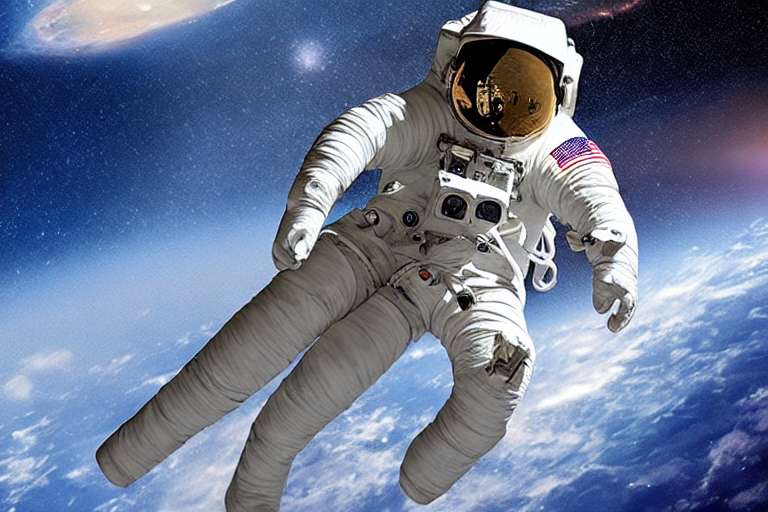

In [ ]:
prompt = "a photograph of an astronaut (sponsored by samsung) riding a horse"

image = pipe(prompt, height=512, width=768).images[0]
image

# 2. LoRA (Low-Rank Adaptation)

- PEFT (Parameter-Efficient Fine-Tuning) 의 일종입니다
- 기존 모델을 크게 변경하지 않고, 특정 태스크에 대한 성능을 개선하는 것이 목표
- 기존의 대형 모델에 쉽게 적용할 수 있으며, 특정 태스크에 맞춘 모델을 빠르게 생성할 수 있습니다


SDXL 에서 공식적으로 지원하기 시작했기 때문에, 누구나 쉽게 사용이 가능합니다

참조 - https://huggingface.co/docs/diffusers/tutorials/using_peft_for_inference#combine-multiple-adapters


## 예제 코드 - Ugly Sonic

- https://huggingface.co/minimaxir/sdxl-ugly-sonic-lora



The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/631 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 17 files:   0%|          | 0/17 [00:00<?, ?it/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


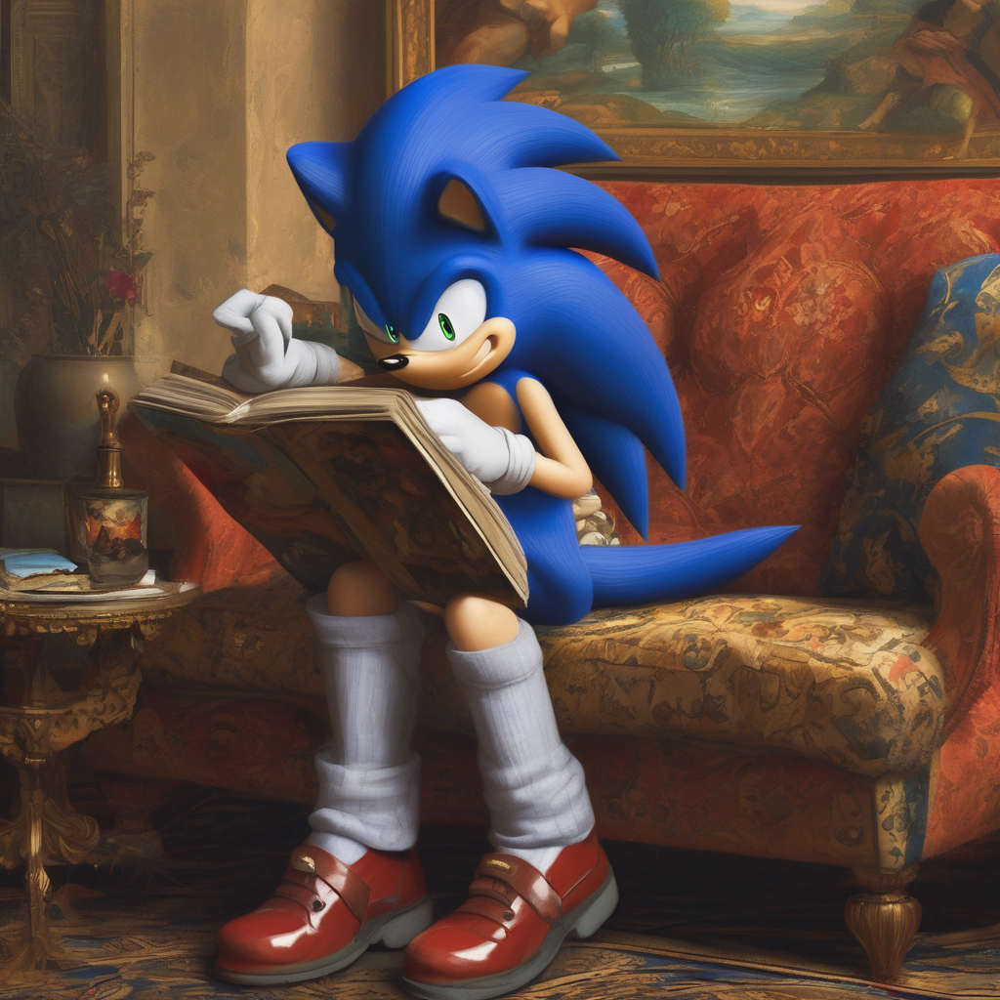

In [3]:
import torch
from diffusers import DiffusionPipeline, AutoencoderKL

vae = AutoencoderKL.from_pretrained(
    "madebyollin/sdxl-vae-fp16-fix",
    torch_dtype=torch.float16
)
base = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    vae=vae,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
)

prompt = "sonic the hedgehog relaxing on a couch, renaissance painting"

base_cuda = base.to("cuda")

base_cuda(prompt).images[0]

pytorch_lora_weights.bin:   0%|          | 0.00/23.7M [00:00<?, ?B/s]

  0%|          | 0/50 [00:00<?, ?it/s]

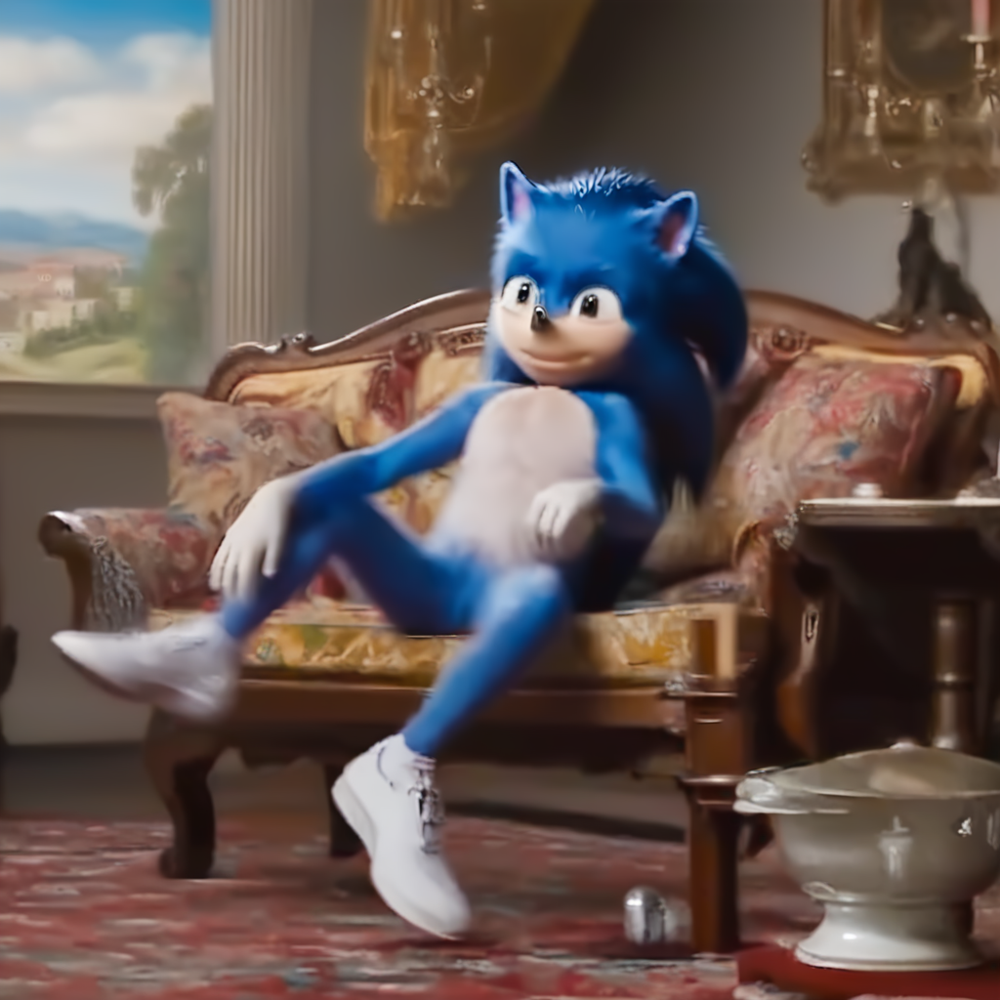

In [ ]:
base.load_lora_weights("minimaxir/sdxl-ugly-sonic-lora")

lora = base.to("cuda")

lora(prompt).images[0]

# 실습

Papercur LoRA 를 직접 추가해 스타일을 변경해 봅시다!  

참조 - https://huggingface.co/TheLastBen/Papercut_SDXL

In [4]:
base.load_lora_weights("TheLastBen/Papercut_SDXL")

lora = base.to("cuda")

#lora(prompt).images[0]

papercut.safetensors:   0%|          | 0.00/341M [00:00<?, ?B/s]

  0%|          | 0/50 [00:00<?, ?it/s]

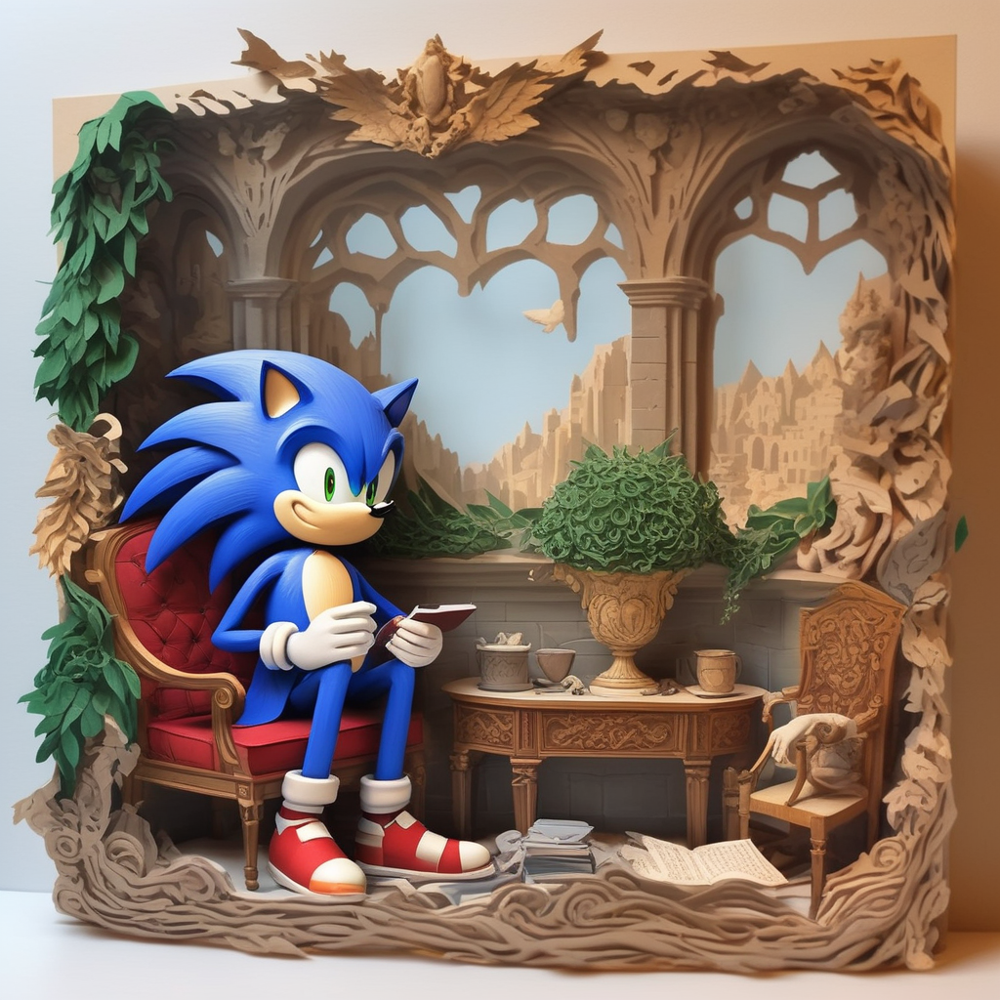

In [5]:
image = lora("papercut, " + prompt).images[0]

image.save(f"paper_sonic.png")

image

ikea_instructions_xl_v1_5.safetensors:   0%|          | 0.00/186M [00:00<?, ?B/s]

  0%|          | 0/50 [00:00<?, ?it/s]

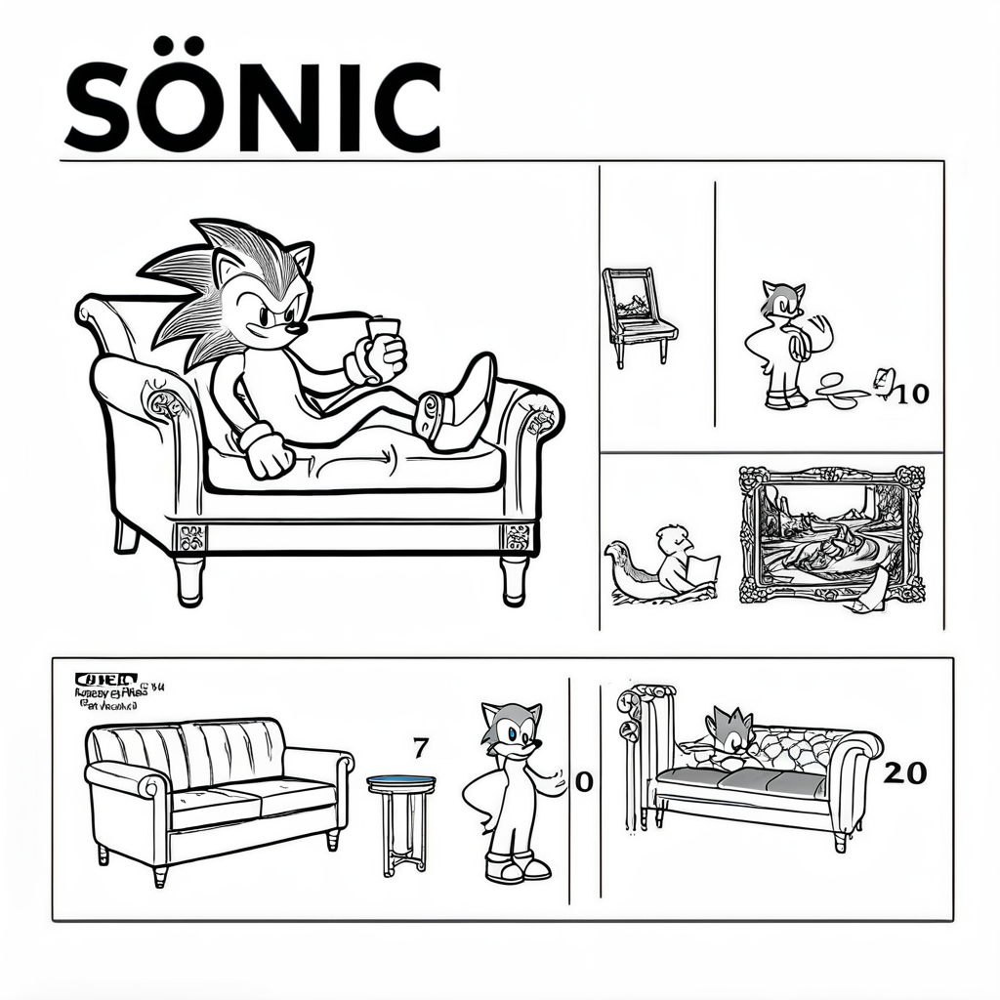

In [6]:
base.load_lora_weights("ostris/ikea-instructions-lora-sdxl")

lora = base.to("cuda")

image = lora(prompt).images[0]

image.save(f"ikea_sonic.png")

image

  0%|          | 0/50 [00:00<?, ?it/s]

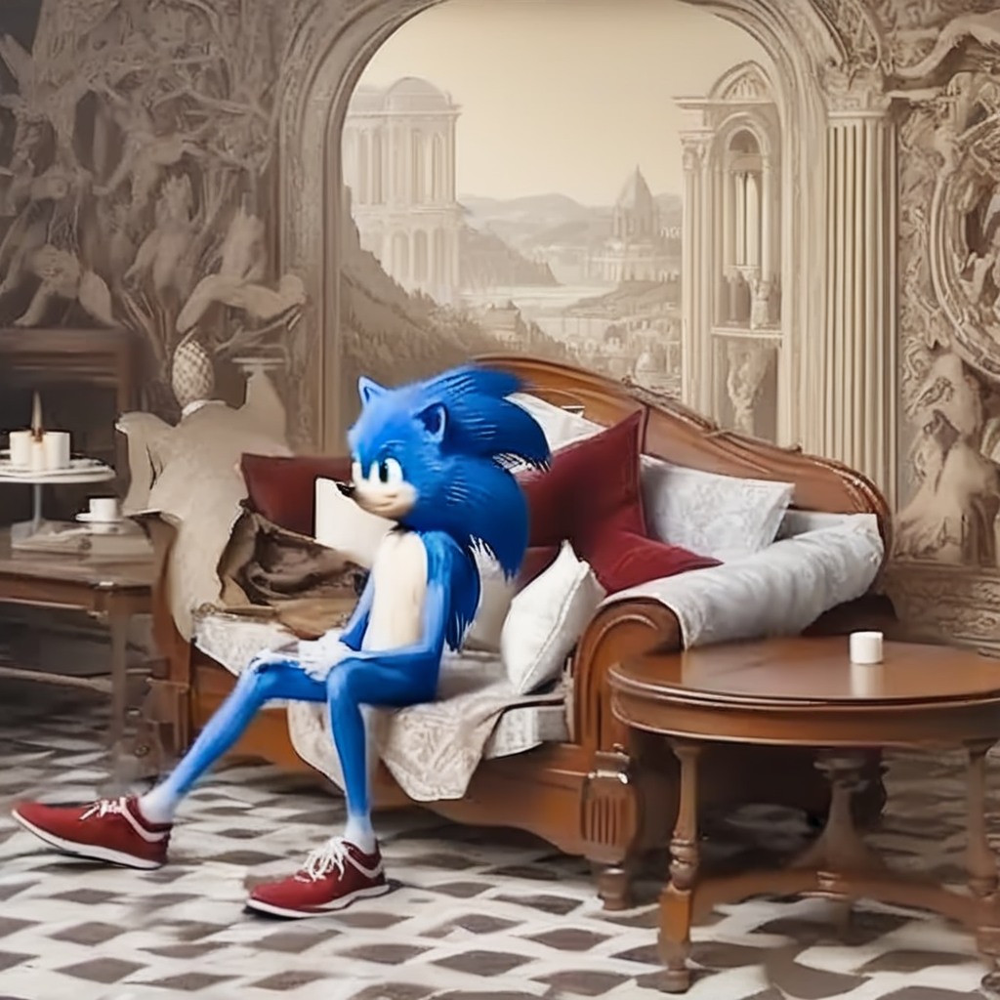

In [ ]:
base.load_lora_weights("TheLastBen/Papercut_SDXL")
base.load_lora_weights("minimaxir/sdxl-ugly-sonic-lora")

lora = base.to("cuda")

lora("papercut, " + prompt).images[0]

## 3. Stable Diffusion

 Stable Diffusion 👩‍🎓 을 조금 더 깊게 가봅시다.

Stable Diffusion 은 diffusion model 중 하나인 **Latent Diffusion**를 기반으로 만들어 졌습니다.  
참고 - [High-Resolution Image Synthesis with Latent Diffusion Models](https://arxiv.org/abs/2112.10752).



일반적이 디퓨전 모델은 *denoise* 를 하는 머신러닝 시스템입니다. 디노이즈는 가우시안 노이즈를 차근차근 없애서 *image* 와 같은 것을 만들어 내는 것입니다.  
참고 -  [this colab](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/diffusers_intro.ipynb).

Diffusion 모델은 이미지를 생성하는 state-of-the-art 입니다.  
단점은 디노이징 과정이 느리다는 점입니다.  
픽셀 공간만큼 메모리도 많이 먹어서 고화질의 이미지를 생성하려면 감당이 안됩니다.  
가장 어려운 점입니다.



<br>

Latent diffusion 은 메모리, 연산 복잡도를 확 줄일 수 있습니다. 이미지를 latent 공간으로 바꿔서 디퓨전 모델의 단점을 보완합니다.  
표준 디퓨전 모델과, latent 디퓨전 모델의 차이점입니다.
  - **in latent diffusion the model is trained to generate latent (compressed) representations of the images.**

latent diffusion 의 3가지 요소 입니다.

1. An autoencoder (VAE).
2. A [U-Net](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/diffusers_intro.ipynb#scrollTo=wW8o1Wp0zRkq).
3. A text-encoder, *e.g.* [CLIP's Text Encoder](https://huggingface.co/docs/transformers/model_doc/clip#transformers.CLIPTextModel).

**1. The autoencoder (VAE)**

VAE model 은 encoder 와 decoder 두 파트가 있습니다.  
- encoder : image ->  low dimensional latent representation  
- decoder : latent representation -> image.


text-to-image Inferece 과정에서는  **VAE decoder** 만 필요합니다.

**2. The U-Net**

역시 encoder, decoder 두 가지로 구성되고, 각 파트는 ResNet block 으로 구성됩니다.
  - encoder: high res image representation -> low res image representation
  - decoder: low res image representation -> high res image representation   
encoder -> decoder 를 거치면, 노이즈가 줄어든 이미지가 생성이 됩니다.

U-Net downsampling 될때 주요 정보를 잃지 않기 위해서 shortcut connection 이 연결이 되어 있습니다. ResNet encoding 블럭과 decoding 블럭 사이에 각각 연결이 되어있습니다.  

추가로 stable diffusion U-Net 은 text-embeddings 이 추가가 되어있습니다.

**3. The Text-encoder**

text-encoder는 인풋 프롬프트 *e.g.* "An astronout riding a horse" 를 embedding space 로 U-Net 이 이해하도록 변경해줍니다.  
보통 간단한 *transformer-based* encoder 를 사용하여 input token들을 latent text-embeddings 들로 변경해줍니다.

[Imagen](https://imagen.research.google/) (구글 딥마인드가 만든 구조) 의 영향을 받아서, Stable Diffusion 은 text-encoder 를 학습 과정에서 같이 학습하지 않습니다. 그냥 이미 학습이 완료된 text encoder 를 사용합니다.  
참고 - [CLIPTextModel](https://huggingface.co/docs/transformers/model_doc/clip#transformers.CLIPTextModel).

**왜 latent diffusion이 더 빠르고 효율적이죠?**

이미지를 주요 정보만 뽑아서 줄여놨으니까 당연히 메모리도, 연산도 줄어듭니다.  
예를 들어, Stable Diffusion 에서 사용되는 VAE 는 8로 나누도록 줄여줍니다. `(3, 512, 512)` 이미지가 `(3, 64, 64)` latent space로 줄어듧니다. `8 × 8 = 64` 배 메모리 사용량이 줄죠.

이것이 `512 × 512` 이미지가 16GB Colab GPU 에서도 빠르게 동작하는 이유입니다.

**Stable Diffusion - inference**

Workflow 를 보겠습니다


<p align="left">
<img src="https://raw.githubusercontent.com/patrickvonplaten/scientific_images/master/stable_diffusion.png" alt="sd-pipeline" width="500"/>
</p>

stable diffusion model 은 latent space seed (완전 노이즈) 와 텍스트 프롬프트의 임베딩을 인풋으로 받습니다. $64 \times 64$ 이미지와 $77 \times 768$ 텍스트 임베딩 으로 동작합니다. (텍스트 임베딩은 CLIP 으로 생성됩니다.)

U-Net 은 반복해서 *denoises* 를 합니다. U-Net 의 결과물은 노이즈가 살짝 걷힌 결과물이고, 스케줄러는 얼마나 노이즈를 걷을 것인지, 어떤 방식으로 걷을 것인지 컨트롤 합니다. 다양한 알고리즘이 있는데, 아래 스케줄러들이 많이 사용됩니다.

- [PNDM scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_pndm.py) (used by default).
- [K-LMS scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_lms_discrete.py).
- [Heun Discrete scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_heun_discrete.py).
- [DPM Solver Multistep scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_dpmsolver_multistep.py).  

이 스케줄러들이 보통 적은 반복수로 양질의 이미지 생성을 하게 해줍니다. 25 ~ 50 정도의 반복이 추천됩니다.  

스케줄러에 대한 자세한 내용 참조 - [Elucidating the Design Space of Diffusion-Based Generative Models](https://arxiv.org/abs/2206.00364)

디노이징 스텝을 모두 반복해서 완료하면, latent space 에서 다시 이미지로 디코딩 하여 완성합니다.  


## 4. `diffusers`로 커스텀 디퓨전 만들기

`diffusers` 라이브러리를 사용하여 커스텀 디퓨전 모델을 만들어 봅시다.
각각의 요소들을 바꿔끼워 넣어서 아웃풋 이미지의 형태를 조절할 수 있습니다.  


Stable Diffusion 의 다른 스케쥴러인 [Katherine Crowson's](https://github.com/crowsonkb) K-LMS scheduler를 사용해 볼 것입니다.  
이 스케쥴러는 A1111 에서도 자주 쓰이는 스케줄러 입니다.

참조 Pull Request - [this PR](https://github.com/huggingface/diffusers/pull/185#pullrequestreview-1074247365).

In [ ]:
import torch
torch_device = "cuda" if torch.cuda.is_available() else "cpu"

[pre-trained model](https://huggingface.co/CompVis/stable-diffusion-v1-3-diffusers/tree/main) 에는 아래와 같은 이름의 폴더안에 각 요소들이 들어가 있습니다.
  

- `text_encoder`: Stable Diffusion 은 CLIP 을 쓰는데 다른 디퓨전 모델들은 `BERT`와 같은 인코더를 쓰기도 합니다.
- `tokenizer`. `text_encoder` 와 짝을 맞춰서 써야 합니다.
- `scheduler`
- `unet`
- `vae`

`subfolder`, `from_pretrained` 변수를 조작해서 원하는데로 설정할 수 있습니다.

In [ ]:
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, PNDMScheduler

# 1. Load the autoencoder model which will be used to decode the latents into image space.
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

# 2. Load the tokenizer and text encoder to tokenize and encode the text.
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# 3. The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")

미리 정의된 스케줄러 대신에 K-LMS scheduler 를 사용해 보겠습니다.

In [ ]:
from diffusers import LMSDiscreteScheduler

scheduler = LMSDiscreteScheduler.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="scheduler")

GPU 에 모델을 올려줍니다.

In [ ]:
vae = vae.to(torch_device)
text_encoder = text_encoder.to(torch_device)
unet = unet.to(torch_device)

이미지 생성을 위해 여러 요소들을 설정합니다.

(참고) `guidance_scale` 은 [Imagen paper](https://arxiv.org/pdf/2205.11487.pdf) 수식 (2) 의  guidance weight `w` 입니다.  
가이던스는 프롬프트를 얼마나 따르는지 를 결정합니다. 적을수록 창의력이 발휘가 됩니다.  7.5 로 세팅을 해주겠습니다.  

이번에는 `num_inference_steps` 을 100 으로 설정해주겠습니다.

In [ ]:
prompt = ["a photograph of an astronaut (sponsored by samsung) riding a horse"]

height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion

num_inference_steps = 100            # Number of denoising steps

guidance_scale = 7.5                # Scale for classifier-free guidance

generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise

batch_size = 1

텍스트 임베딩을 생성합니다.
자유도 높은 생성을 위해 classifier-free guidance 기법을 이용하고자 합니다.  
텍스트 임베딩 관련 내용이라 자세한 내용은 생략합니다.  

In [ ]:
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")

with torch.no_grad():
  text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
  uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]

text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

랜덤 노이즈를 생성합니다.

In [ ]:
latents = torch.randn(
  (batch_size, unet.in_channels, height // 8, width // 8),
  generator=generator,
)
latents = latents.to(torch_device)

In [ ]:
latents.shape

예상대로 $64 \times 64$ 사이즈 벡터가 나와야 합니다. 나중에 이미지로 변경시에 `512 × 512` 사이즈로 복원됩니다.

`num_inference_steps` 로 스케줄러를 설정 합니다.

In [ ]:
scheduler.set_timesteps(num_inference_steps)

K-LMS scheduler를 준비합니다.

In [ ]:
latents = latents * scheduler.init_noise_sigma

denoising loop 을 동작합니다.

In [ ]:
from tqdm.auto import tqdm
from torch import autocast

for t in tqdm(scheduler.timesteps):
  # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
  latent_model_input = torch.cat([latents] * 2)

  latent_model_input = scheduler.scale_model_input(latent_model_input, t)

  # predict the noise residual
  with torch.no_grad():
    noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

  # perform guidance
  noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
  noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

  # compute the previous noisy sample x_t -> x_t-1
  latents = scheduler.step(noise_pred, t, latents).prev_sample

`vae`로 `latents` 를 디코딩하여 이미지를 복원합니다.

In [ ]:
# scale and decode the image latents with vae
latents = 1 / 0.18215 * latents

with torch.no_grad():
  image = vae.decode(latents).sample

PIL 을 사용하여 화면에 이미지를 표시합니다.

In [ ]:
image = (image / 2 + 0.5).clamp(0, 1)
image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
images = (image * 255).round().astype("uint8")
pil_images = [Image.fromarray(image) for image in images]
pil_images[0]

커스텀 디퓨전 모델을 만들었습니다 🔥.

In [11]:
!nvidia-smi

Wed May 29 04:16:47 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   49C    P0              28W /  70W |  14901MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [4]:
import torch

from diffusers import StableVideoDiffusionPipeline
from diffusers.utils import load_image, export_to_video

pipe = StableVideoDiffusionPipeline.from_pretrained(
    "stabilityai/stable-video-diffusion-img2vid-xt", torch_dtype=torch.float16, variant="fp16"
)
pipe.enable_model_cpu_offload()

# Load the conditioning image
image = load_image("./paper_sonic.png")
#image = image.resize((1024, 576))

generator = torch.manual_seed(42)
frames = pipe(image, decode_chunk_size=8, generator=generator).frames[0]

export_to_video(frames, "generated.mp4", fps=3)

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


  0%|          | 0/25 [00:00<?, ?it/s]

'generated.mp4'